<a href="https://colab.research.google.com/github/Kashishkewat/machine-learning/blob/main/Dtreeviz.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **decision tree visualization using dtreeviz library**

In [1]:
pip install dtreeviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 5.4 MB/s eta 0:00:00


In [2]:
import graphviz.backend as be

In [3]:
from sklearn.datasets import *
from dtreeviz.trees import *
from IPython.display import Image, display_svg,SVG

In [4]:
clas=tree.DecisionTreeClassifier(max_depth=2)
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=2)

[Text(0.4, 0.8333333333333334, 'x[3] <= 0.8\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(0.2, 0.5, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(0.30000000000000004, 0.6666666666666667, 'True  '),
 Text(0.6, 0.5, 'x[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(0.5, 0.6666666666666667, '  False'),
 Text(0.4, 0.16666666666666666, 'gini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(0.8, 0.16666666666666666, 'gini = 0.043\nsamples = 46\nvalue = [0, 1, 45]')]

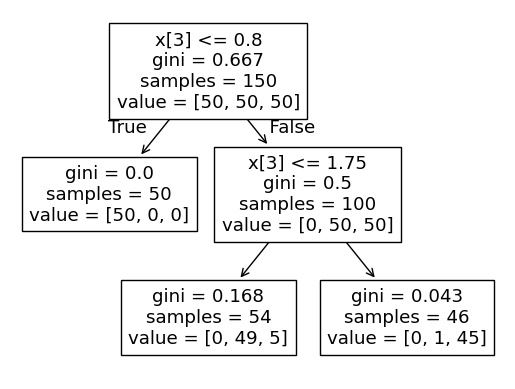

In [5]:
from sklearn.tree import plot_tree
plot_tree(clas)

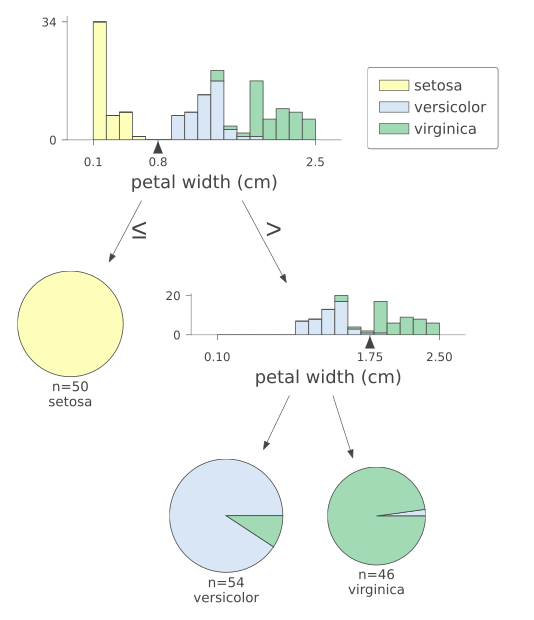

In [6]:
from dtreeviz import model
m = model(clas,
          X_train=X_train,
          y_train=y_train,
          feature_names=iris.feature_names,
          class_names=['setosa','versicolor','virginica'],
          )
v = m.view(scale=2)
from IPython.display import display
display(v)

# **Regression**

In [7]:
reg=tree.DecisionTreeRegressor(max_depth=2)
cl=fetch_california_housing()

In [8]:
X_train=cl.data
y_train=cl.target

In [9]:
reg.fit(X_train ,y_train)

DecisionTreeRegressor(max_depth=2)

In [10]:
m=model(
    reg,
    X_train=X_train,
    y_train=y_train,
    feature_names=cl.feature_names,
    target_name=cl.target_names,
)
v=m.view(scale=2)
display(v)


# **Horizontal Decision Tree**

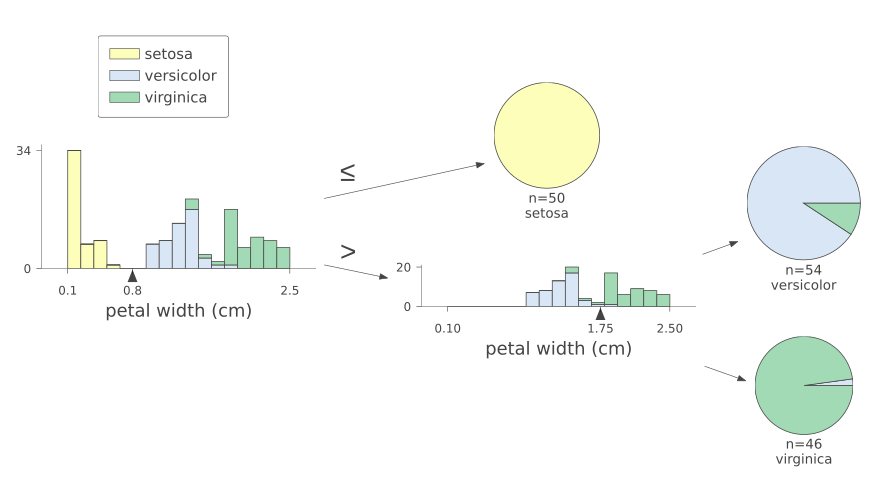

In [11]:
from dtreeviz import model
m = model(clas,
          X_train=iris.data,
          y_train=iris.target,
          feature_names=iris.feature_names,
          class_names=['setosa','versicolor','virginica']
          )
v = m.view(scale=2, orientation='LR')
from IPython.display import display
display(v)

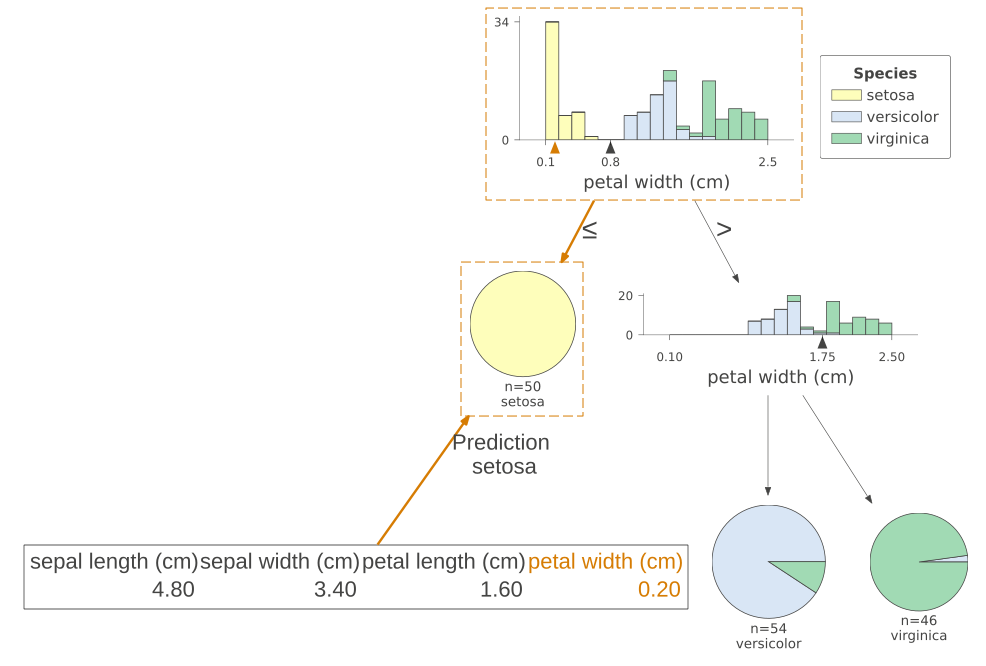

In [12]:
clas=tree.DecisionTreeClassifier(max_depth=2)
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)
x=iris.data[np.random.randint(0,len(iris.data)),:]
m=model(
    clas,
    X_train,
    y_train,
    target_name="Species", # Added a single string for target_name
    feature_names=iris.feature_names,
    class_names=['setosa','versicolor','virginica'],
)
v=m.view(scale=2, x=x) # Retained scale and corrected 'X' to 'x'
display(v)

# **show node label**

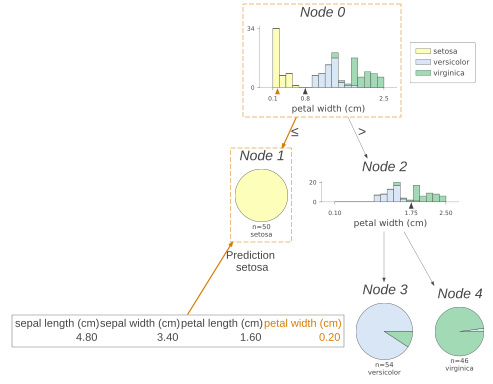

In [13]:
m=model(
    clas,
    X_train,
    y_train,
    feature_names=iris.feature_names,
    class_names=['setosa','versicolor','virginica'],
)
v=m.view( x=x,show_node_labels=True)
display(v)

# **without any graphs**

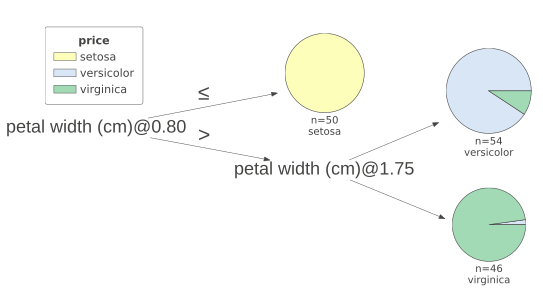

In [14]:
m=model(clas,
        X_train,
        y_train,
        target_name='price',
        feature_names=iris.feature_names,
        class_names=['setosa','versicolor','virginica'])
v=m.view(scale=1.5,orientation='LR',fancy=False)
display(v)

# **show just prediction path,nothing else**

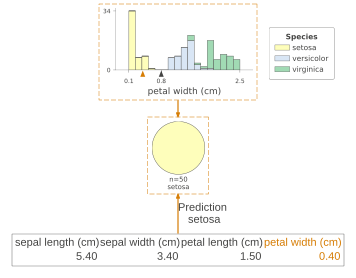

In [15]:
clas=tree.DecisionTreeClassifier()
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)
X=iris.data[np.random.randint(0,len(iris.data)),:]
m=model(clas,
        X_train,
        y_train,
        target_name='Species',
        class_names=iris.target_names,
        feature_names=iris.feature_names)
v=m.view(x=X,show_just_path=True)
display(v)

# **Prediction path in plain english**

In [16]:
from dtreeviz.trees import explain_prediction_plain_english
from dtreeviz import model

clas = tree.DecisionTreeClassifier() # Re-initializing clas
iris = load_iris()
X_train = iris.data
y_train = iris.target
clas.fit(X_train, y_train) # Fitting the classifier
X = iris.data[np.random.randint(0,len(iris.data)),:]

m = model(clas,
          X_train,
          y_train,
          target_name='Species',
          class_names=iris.target_names,
          feature_names=iris.feature_names)

print(explain_prediction_plain_english(m.shadow_tree, X))

2.45 <= petal length (cm)  < 4.95
petal width (cm) < 1.65



# **Feature Importance**

None


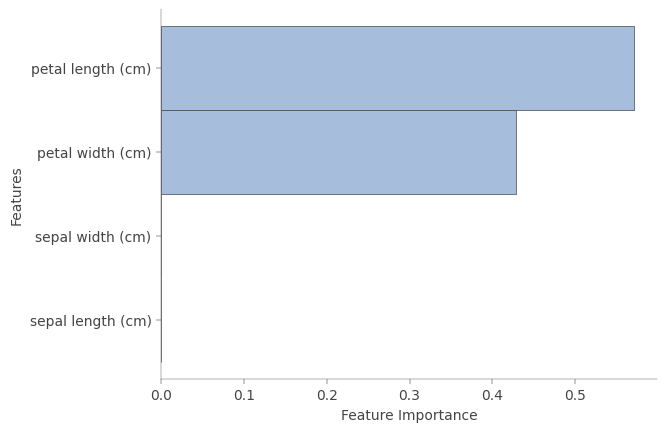

In [17]:
from dtreeviz.trees import explain_prediction_sklearn_default
from dtreeviz import model
clas=tree.DecisionTreeClassifier()
iris=load_iris()
X_train=iris.data
y_train=iris.target
clas.fit(X_train,y_train)
m = model(clas,
          X_train,
          y_train,
          target_name='Species',
          class_names=iris.target_names,
          feature_names=iris.feature_names)

print(explain_prediction_sklearn_default(m.shadow_tree, X))

# **Univariate Regression**

In [26]:
import seaborn as sns

# Load the mpg dataset from seaborn
df_cars = sns.load_dataset('mpg')

# Rename columns to match the expected 'WGT', 'ENG', 'MPG'
df_cars = df_cars.rename(columns={'weight': 'WGT', 'horsepower': 'ENG', 'mpg': 'MPG'})

# Drop rows with NaN values if any, as DecisionTreeRegressor does not handle them
df_cars.dropna(inplace=True)

# Display the first few rows to verify
display(df_cars.head())

,MPG,cylinders,displacement,ENG,WGT,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


In [30]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from dtreeviz import model # Import model instead of specific viz function

X=df_cars[['WGT','ENG']]
y=df_cars['MPG']
dt=DecisionTreeRegressor(max_depth=3,criterion="absolute_error")
dt.fit(X,y)

m = model(dt, X_train=X, y_train=y, feature_names=['Vehicle Weight','Horse Power'], target_name='MPG')
v = m.view(elev=20,azim=25,dist=8.2,show={'splits','titlt'},
           ax=ax)

from IPython.display import display
display(v)

TypeError: DTreeVizAPI.view() got an unexpected keyword argument 'elev'